## Stratification during ENSO

In [1]:
import xarray as xr
import matplotlib.pyplot as plt
from cmocean import cm # for oceanography-specific colormaps
from scipy.io import loadmat
import numpy as np
import re
from xml.etree import ElementTree as ET
from matplotlib.path import Path
import pandas as pd

In [2]:
## kml to struct
from xml.etree import ElementTree as ET

def kml2struct(kml_file):
    """
    Import a .kml file as a list of dictionary structures with fields:
    Geometry, Name, Description, Lon, Lat, and BoundingBox.
    """
    # Read the KML file
    try:
        with open(kml_file, 'r', encoding='utf-8') as file:
            txt = file.read()
    except Exception as e:
        raise FileNotFoundError(f"Unable to open file {kml_file}: {e}")

    # Regular expression to match Placemark tags
    expr = r"<Placemark.+?>.+?</Placemark>"
    object_strings = re.findall(expr, txt, re.DOTALL)
    
    kml_struct = []

    for obj_str in object_strings:
        # Extract Name
        name_match = re.search(r"<name.*?>(.*?)</name>", obj_str, re.DOTALL)
        name = name_match.group(1).strip() if name_match else "undefined"

        # Extract Description
        desc_match = re.search(r"<description.*?>(.*?)</description>", obj_str, re.DOTALL)
        desc = desc_match.group(1).strip() if desc_match else ""

        # Determine Geometry Type
        geometry = ""
        if "<Point" in obj_str:
            geometry = "Point"
        elif "<LineString" in obj_str:
            geometry = "Line"
        elif "<Polygon" in obj_str:
            geometry = "Polygon"

        # Extract Coordinates
        coord_match = re.search(r"<coordinates.*?>(.*?)</coordinates>", obj_str, re.DOTALL)
        if not coord_match:
            continue  # Skip if no coordinates are found
        coord_str = coord_match.group(1).strip()
        coord_list = np.array([list(map(float, coord.split(','))) for coord in coord_str.split()])

        # Separate Lon, Lat, and handle Polygons
        lon = coord_list[:, 0]
        lat = coord_list[:, 1]
        if geometry == "Polygon":
            # Close the polygon by appending NaN
            lon = np.append(lon, np.nan)
            lat = np.append(lat, np.nan)

        # Create BoundingBox
        bounding_box = [[lon.min(), lat.min()], [lon.max(), lat.max()]]

        # Append to kml_struct
        kml_struct.append({
            "Geometry": geometry,
            "Name": name,
            "Description": desc,
            "Lon": lon,
            "Lat": lat,
            "BoundingBox": bounding_box
        })

    return kml_struct

In [3]:
# Load the KML file to get the polygon boundary
arch_kml_zona1 = "../../NHCS/hindcast/CROCO_BioEBUS_1990-2010/indices/BK111km.kml"
R1 = kml2struct(arch_kml_zona1)

# Extract Lon and Lat from the first polygon
lonb1 = R1[0]["Lon"]
latb1 = R1[0]["Lat"]

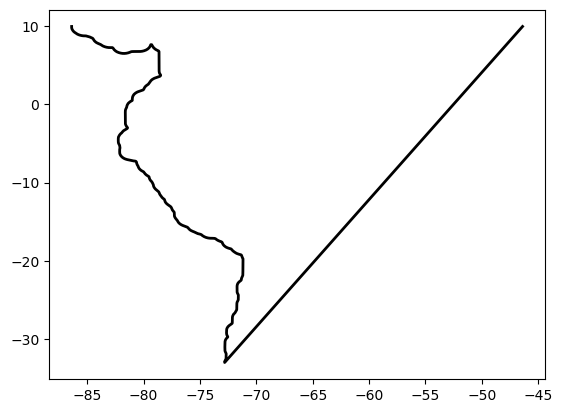

In [4]:
plt.plot(lonb1,latb1,color='k',linewidth=2)

In [5]:
ds = xr.open_dataset('../../NHCS/hincast_1980-2015/croco_avg_Y1980M01.nc', 
                     chunks = {'time':1})
ds

<xarray.Dataset> Size: 891MB
Dimensions:     (xi_rho: 602, xi_u: 601, eta_rho: 542, eta_v: 541, s_rho: 32,
                 s_w: 33, time: 1, auxil: 4)
Coordinates: (12/13)
  * xi_rho      (xi_rho) float64 5kB 1.0 2.0 3.0 4.0 ... 599.0 600.0 601.0 602.0
  * xi_u        (xi_u) float64 5kB 1.5 2.5 3.5 4.5 ... 598.5 599.5 600.5 601.5
  * eta_rho     (eta_rho) float64 4kB 1.0 2.0 3.0 4.0 ... 540.0 541.0 542.0
  * eta_v       (eta_v) float64 4kB 1.5 2.5 3.5 4.5 ... 538.5 539.5 540.5 541.5
  * s_rho       (s_rho) float64 256B -0.9844 -0.9531 ... -0.04688 -0.01562
  * s_w         (s_w) float64 264B -1.0 -0.9688 -0.9375 ... -0.0625 -0.03125 0.0
    ...          ...
    lat_rho     (eta_rho, xi_rho) float64 3MB dask.array<chunksize=(542, 602), meta=np.ndarray>
    lon_u       (eta_rho, xi_u) float64 3MB dask.array<chunksize=(542, 601), meta=np.ndarray>
    lat_u       (eta_rho, xi_u) float64 3MB dask.array<chunksize=(542, 601), meta=np.ndarray>
    lon_v       (eta_v, xi_rho) float64 3MB dask.array<chunksize=(541, 602), meta=np.ndarray>
    lat_v       (eta_v, xi_rho) float64 3MB dask.array<chunksize=(541, 602), meta=np.ndarray>
  * time        (time) float32 4B 1.339e+06
Dimensions without coordinates: auxil
Data variables: (12/54)
    spherical   |S1 1B ...
    xl          float64 8B ...
    el          float64 8B ...
    Vtransform  float64 8B ...
    sc_r        (s_rho) float64 256B dask.array<chunksize=(32,), meta=np.ndarray>
    sc_w        (s_w) float64 264B dask.array<chunksize=(33,), meta=np.ndarray>
    ...          ...
    swflux      (time, eta_rho, xi_rho) float32 1MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    radsw       (time, eta_rho, xi_rho) float32 1MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    shflx_rlw   (time, eta_rho, xi_rho) float32 1MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    shflx_lat   (time, eta_rho, xi_rho) float32 1MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    shflx_sen   (time, eta_rho, xi_rho) float32 1MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    hel         (time, eta_rho, xi_rho) float32 1MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
Attributes: (12/57)
    type:           ROMS restart file
    title:          Peru UW Interannual Run
    date:           
    rst_file:       croco_rst.nc
    his_file:       croco_his.nc
    avg_file:       croco_avg.nc
    ...             ...
    gamma2_expl:    Slipperiness parameter
    x_sponge:       0.0
    v_sponge:       0.0
    sponge_expl:    Sponge parameters : extent (m) & viscosity (m2.s-1)
    SRCS:           main.F step.F read_inp.F timers_roms.F init_scalars.F ini...
    CPP-options:    REGIONAL PERU_UW MPI OBC_WEST OBC_NORTH OBC_SOUTH BIOLOGY...

In [6]:
# ds.lon_rho.compute().values[0,:-1].shape
ds.v.isel(time=0,s_rho=-1)

<xarray.DataArray 'v' (eta_v: 541, xi_rho: 602)> Size: 1MB
dask.array<getitem, shape=(541, 602), dtype=float32, chunksize=(541, 602), chunktype=numpy.ndarray>
Coordinates:
  * xi_rho   (xi_rho) float64 5kB 1.0 2.0 3.0 4.0 ... 599.0 600.0 601.0 602.0
  * eta_v    (eta_v) float64 4kB 1.5 2.5 3.5 4.5 5.5 ... 538.5 539.5 540.5 541.5
    s_rho    float64 8B -0.01562
    lon_v    (eta_v, xi_rho) float64 3MB dask.array<chunksize=(541, 602), meta=np.ndarray>
    lat_v    (eta_v, xi_rho) float64 3MB dask.array<chunksize=(541, 602), meta=np.ndarray>
    time     float32 4B 1.339e+06
Attributes:
    long_name:      averaged v-momentum component
    units:          meter second-1
    field:          v-velocity, scalar, series
    standard_name:  sea_water_y_velocity_at_v_location

## U and V

In [7]:
u_da = (
    ds.u.isel(s_rho=-1).reset_coords(
    drop=True).assign_coords(
    xi_u=ds.lon_rho.compute().values[0,:-1], 
    eta_rho=ds.lat_rho.compute().values[:,0]
    ).rename({'eta_rho': 'lat', 'xi_u': 'lon'}))

v_da = (
    ds.v.isel(s_rho=-1).reset_coords(
    drop=True).assign_coords(
    xi_rho=ds.lon_rho.compute().values[0,:], 
    eta_v=ds.lat_rho.compute().values[:-1,0]
    ).rename({'eta_v': 'lat', 'xi_rho': 'lon'}))

print(u_da.shape, v_da.shape)

(1, 542, 601) (1, 541, 602)


In [8]:
# 1) Build the 2D lat/lon grid of u
lon_u2d, lat_u2d = xr.broadcast(v_da['lon'], u_da['lat'])  # both (542, 601)

# 2) Interpolate v onto u's grid using real lat/lon coordinates
v = v_da.interp(lat=lat_u2d, lon=lon_u2d)
u = u_da.interp(lat=lat_u2d, lon=lon_u2d)
print(u.shape, v.shape)  # both (542, 602)

(1, 602, 542) (1, 602, 542)


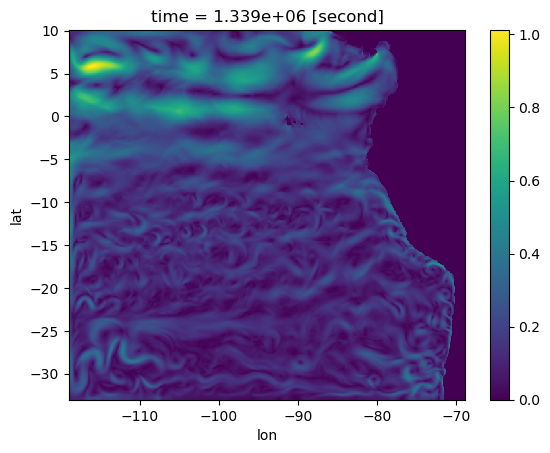

In [9]:
UV = ((u.isel(time=0)**2 + v.isel(time=0)**2)**0.5).T
UV.plot()

In [10]:
# Lista ordenada de archivos
from pathlib import Path
files = sorted(Path("../../NHCS/hincast_1980-2015/").glob("croco_avg_Y*M*.nc"))

# Extraer tiempo desde nombre de archivo
def extract_datetime_from_filename(path):
    match = re.search(r"Y(\d{4})M(\d{2})", path.name)
    if match:
        year = int(match.group(1))
        month = int(match.group(2))
        return np.datetime64(f"{year}-{month:02d}")
    else:
        raise ValueError(f"Fecha no encontrada en nombre: {path.name}")

# Lista de tiempos correctos
time_values = [extract_datetime_from_filename(f) for f in files]

# Cargar variables U,V en superficie
def load_surface_UV(path, time_val):
    time_val = np.datetime64(time_val, 'ns') 
    ds = xr.open_dataset(path, chunks={"time": 1})

    u_da = (
        ds.u.isel(s_rho=-1).squeeze("time", drop=True).reset_coords(
            drop=True).assign_coords(
            xi_u=ds.lon_rho.compute().values[0,:-1], 
            eta_rho=ds.lat_rho.compute().values[:,0])
        .rename({'eta_rho': 'lat', 'xi_u': 'lon'})
        .expand_dims(time=[time_val]))

    v_da = (
        ds.v.isel(s_rho=-1).squeeze("time", drop=True).reset_coords(
            drop=True).assign_coords(
            xi_rho=ds.lon_rho.compute().values[0,:], 
            eta_v=ds.lat_rho.compute().values[:-1,0])
        .rename({'eta_v': 'lat', 'xi_rho': 'lon'})
        .expand_dims(time=[time_val]))

    #interpolate
    v = v_da.interp(lat=lat_u2d, lon=lon_u2d)
    u = u_da.interp(lat=lat_u2d, lon=lon_u2d)

    #dataset
    UV = xr.Dataset(
        {
            "u": u,
            "v": v,
        },
        coords={"time": [time_val]}
    )
    # Construir Dataset con ambas
    return UV
#         {
#             "LPHYTO": LPHYTO,
#             "SPHYTO": SPHYTO
#         },
#         coords={"time": [time_val]}
#     )

# # Crear lista de Datasets
# phyto_list = [load_surface_phyto(f, t) for f, t in zip(files, time_values)]

# # Concatenar por tiempo
# phyto_all = xr.concat(phyto_list, dim="time")

In [11]:
from tqdm import tqdm
UV_list = [load_surface_UV(p, t) for p, t in tqdm(zip(files, time_values),
                                                  total=len(files))]
UV_all = xr.concat(UV_list, dim="time")

100%|██████████████████████████████████████████████████████████████████████████████████| 432/432 [01:15<00:00,  5.74it/s]


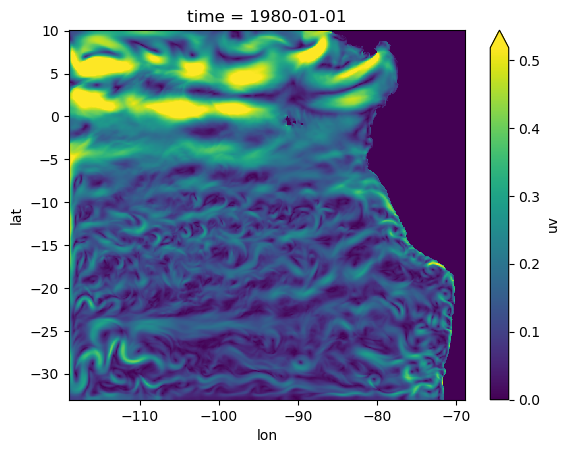

In [12]:
UV_all['uv']=(UV_all.u **2 + UV_all.v**2).T**0.5
UV_all.uv.isel(time=0).plot(robust=True)

In [15]:
UV_all = UV_all.compute()
UV_all

<xarray.Dataset> Size: 3GB
Dimensions:  (time: 432, lon: 602, lat: 542)
Coordinates:
  * time     (time) datetime64[ns] 3kB 1980-01-01 1980-02-01 ... 2015-12-01
  * lat      (lat) float64 4kB -33.0 -32.93 -32.86 -32.79 ... 9.869 9.951 10.03
  * lon      (lon) float64 5kB -119.0 -118.9 -118.8 ... -69.03 -68.95 -68.87
Data variables:
    u        (time, lon, lat) float64 1GB 0.08685 0.08908 0.09033 ... nan nan
    v        (time, lon, lat) float64 1GB 0.02592 0.02564 0.02268 ... 0.0 nan
    uv       (lat, lon, time) float64 1GB 0.09064 0.05193 0.006 ... nan nan nan

In [16]:
# UV_all.to_netcdf('UV_velocities.nc')

## Data

In [108]:
MLD = loadmat("../../NHCS/Processed/WMLD_MLD.mat")
print(MLD.keys())

dict_keys(['__header__', '__version__', '__globals__', 'MLD', 'WMLD'])


In [109]:
# ¨WMLD_MLD
SST = loadmat("../../NHCS/Processed/SST_SSH.mat")
print(SST.keys())

dict_keys(['__header__', '__version__', '__globals__', 'SSH', 'SST'])


In [110]:
# EKMAN_components

Curl = loadmat("../../NHCS/Processed/EKMAN_components.mat")
print(Curl.keys())

dict_keys(['__header__', '__version__', '__globals__', 'Curl', 'Divergence', 'Crosshore_wind', 'VTauy', 'EK_pump', 'UEK', 'VEK', 'LTM_ekpump'])


In [111]:
## mask
print(ds.mask_rho.shape)
mask_rho = ds.mask_rho.values 
mask_nan = np.where(mask_rho, 1, np.nan)
expanded_mask = np.tile(mask_nan[np.newaxis, :, :], (432, 1, 1))
print(expanded_mask.shape)
print(MLD['WMLD'].shape)

(542, 602)
(432, 542, 602)
(542, 602, 432)


In [112]:
time = pd.date_range(start="1980-01",end="2016-01",freq='M')

Strat_ds = xr.Dataset(
    data_vars={
        'MLD': (("time", "lat","lon"), MLD['MLD'].transpose(2, 1, 0)*expanded_mask),
        'WMLD': (("time", "lat","lon"), MLD['WMLD'].transpose(2, 0, 1)*expanded_mask),
        'Curl':(("time", "lat","lon"), Curl['Curl'].transpose(2, 1, 0)*-1),
        'Ekt':(("time", "lat","lon"), Curl['UEK'].transpose(2, 1, 0)*-1),
        'SST':(("time", "lat","lon"), SST['SST'].transpose(2, 1, 0)*expanded_mask),
        'SSH':(("time", "lat","lon"), SST['SSH'].transpose(2, 1, 0)*expanded_mask),
    },
    coords = {
        'lon':ds.lon_rho.compute().values[0,:],
        'lat':ds.lat_rho.compute().values[:,0],
        'time':time
}
)

Strat_ds['SSH'] = Strat_ds['SSH']*100 #cm
Strat_ds['Curl'] = Strat_ds['Curl']*86400
Strat_ds['WMLD'] = Strat_ds['WMLD']*86400
Strat_ds['Ekt'] = Strat_ds['Ekt']*86400

/tmp/ipykernel_133256/590154343.py:1: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  time = pd.date_range(start="1980-01",end="2016-01",freq='M')


In [148]:
Strat_ts = Strat_ds.sel(lat=slice(-20,0),lon=slice(-110,-72))
strat_mmean = Strat_ts.groupby('time.month').mean(dim='time')
strat_anomaly = Strat_ts.groupby('time.month') - strat_mmean

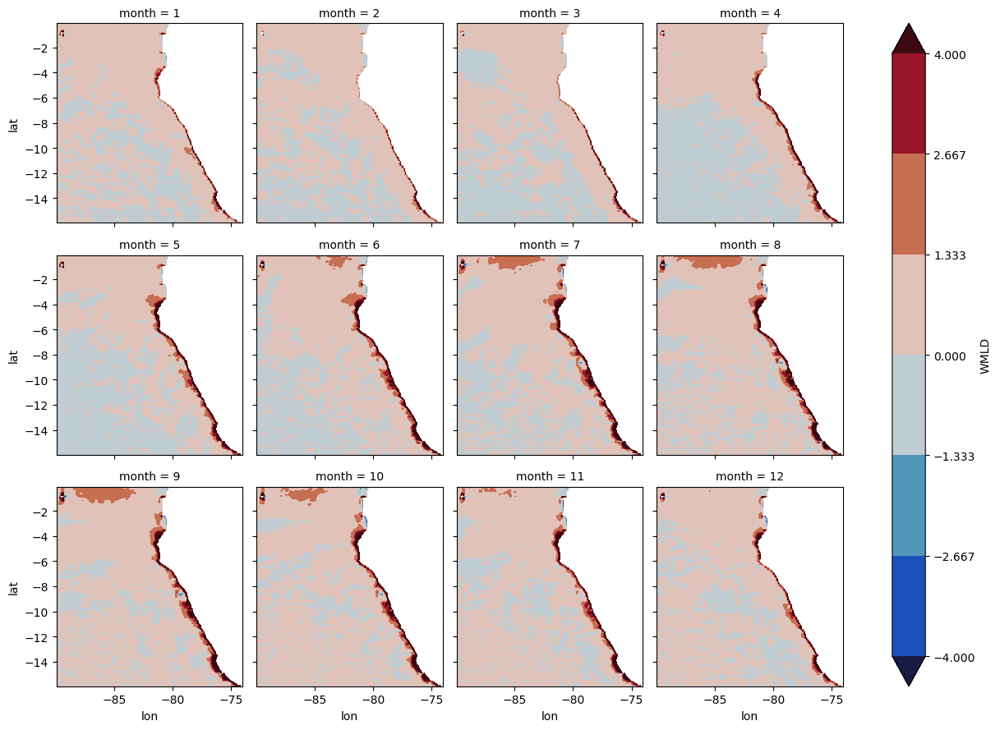

In [119]:
strat_mmean.WMLD.plot.contourf(x="lon", y="lat", col="month", col_wrap=4,vmin= -4 ,vmax= 4,cmap=cm.balance)

### ENSO 82-83

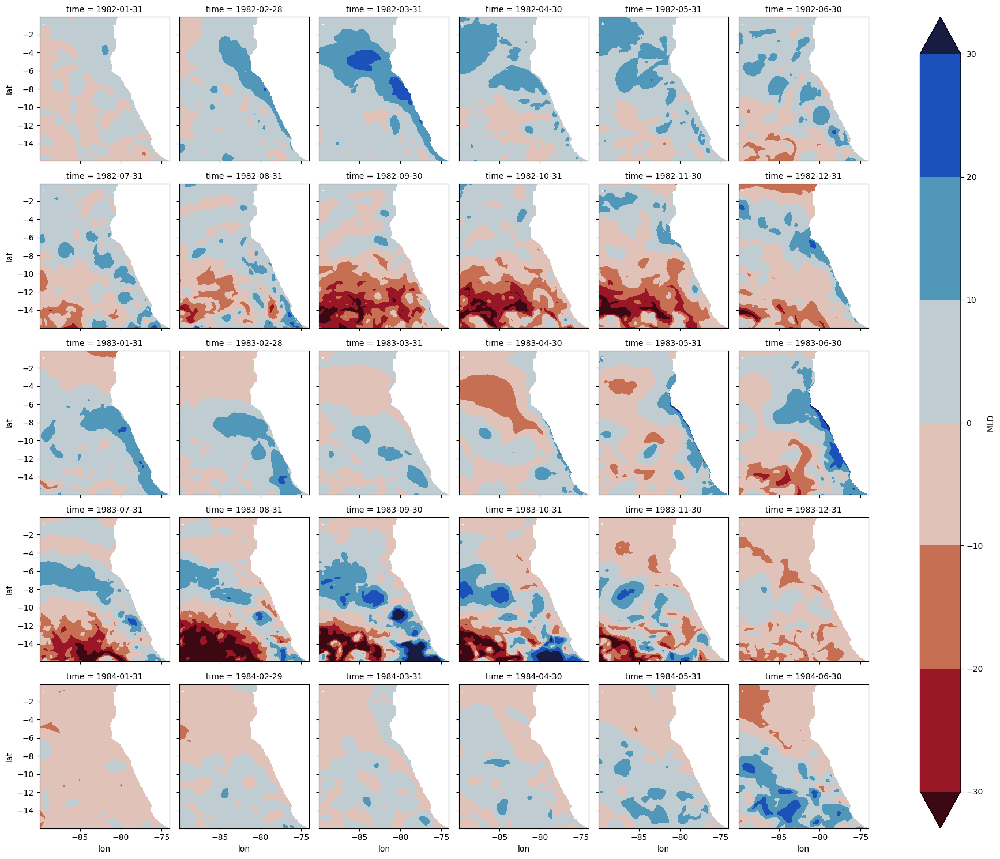

In [116]:
strat_anomaly.MLD.sel(time=slice("1982-01","1984-06")).plot.contourf(x="lon", 
                                                            y="lat", col="time", col_wrap=6, 
                                                            vmin=-30,vmax=30,cmap=cm.balance_r,
                                                           )
# plt.savefig('Figures/ppt_MLDa_ENSO_8283'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

/tmp/ipykernel_1156486/1488866831.py:10: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in g.axes.flat:


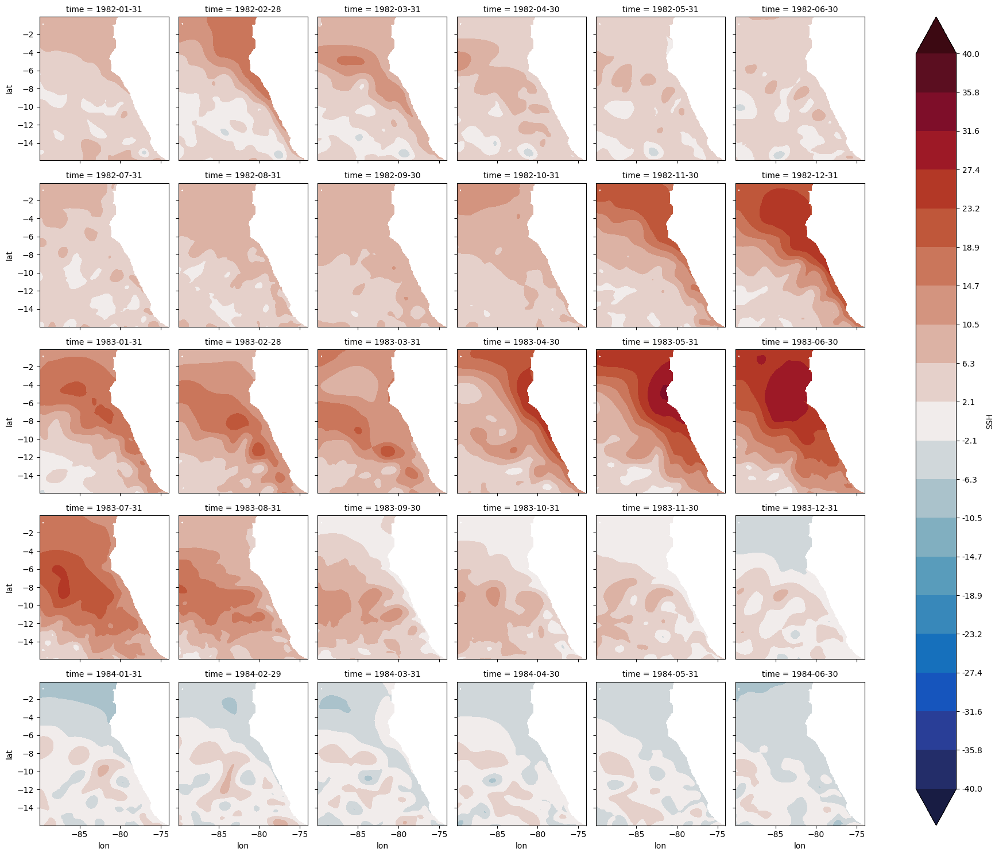

In [11]:
from matplotlib.colors import TwoSlopeNorm 

norm = TwoSlopeNorm(vmin=-40, vcenter=0, vmax=40)
levels=np.linspace(-40,40,20)
# strat_anomaly.SSH.sel(time=slice("1982-01","1984-07")).plot(x="lon", y="lat", col="time", col_wrap=5, vmin=-0.5,vmax=0.5,cmap=cm.balance)

g=strat_anomaly.SSH.sel(time=slice("1982-01","1984-06")).plot.contourf(x="lon", y="lat", col="time", col_wrap=6, vmin=-40,vmax=40,
                                                                     cmap=cm.balance,norm=norm, extend='both',levels=levels)
# # Round the colorbar tick labels
for ax in g.axes.flat:
    if hasattr(ax, "collections") and ax.collections:
        cbar = ax.collections[0].colorbar  # Get colorbar from the first contour collection
        if cbar is not None:
            cbar.set_ticks(levels)  # Set tick positions
            cbar.set_ticklabels([f'{tick:.1f}' for tick in levels])  # Format tick labels


# plt.savefig('Figures/SSHa_ENSO_8283'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

In [12]:
# import matplotlib.pyplot as plt

# # Create contour plot
# g = strat_anomaly.SSH.sel(time=slice("1982-01", "1984-07")).plot.contour(
#     x="lon", y="lat", col="time", col_wrap=5,
#     colors='black', norm=norm, extend='both', levels=levels, linestyles='--', alpha=0.7,
# )

# # Loop through each subplot and add labels
# for i, ax in enumerate(g.axs.flat):  # Use .axs instead of .axes
#     # Get the contour sets created in each subplot
#     contour_set = ax.collections  # `collections` contains contour lines
    
#     if contour_set:
#         ax.clabel(contour_set[0], inline=True, fontsize=8,fmt="%.f")  # Add contour labels

# plt.show()


/tmp/ipykernel_1156486/880485100.py:6: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in g.axes.flat:


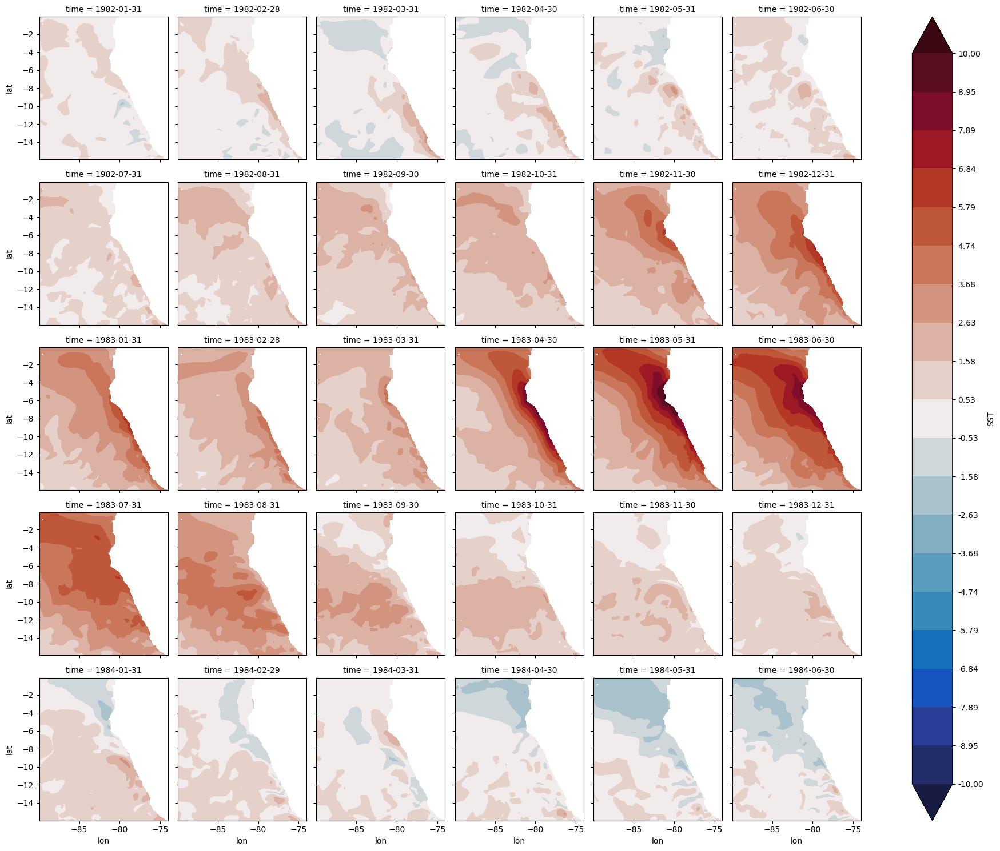

In [13]:
norm = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=10)
levels=np.linspace(-10,10,20)
g=strat_anomaly.SST.sel(time=slice("1982-01","1984-06")).plot.contourf(x="lon", y="lat", col="time", col_wrap=6,
                                                                     cmap=cm.balance,norm=norm, extend='both',levels=levels)
# # Round the colorbar tick labels
for ax in g.axes.flat:
    if hasattr(ax, "collections") and ax.collections:
        cbar = ax.collections[0].colorbar  # Get colorbar from the first contour collection
        if cbar is not None:
            cbar.set_ticks(levels)  # Set tick positions
            cbar.set_ticklabels([f'{tick:.2f}' for tick in levels])  # Format tick labels
            
# plt.savefig('Figures/SSTa_ENSO_8283'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')

plt.show()



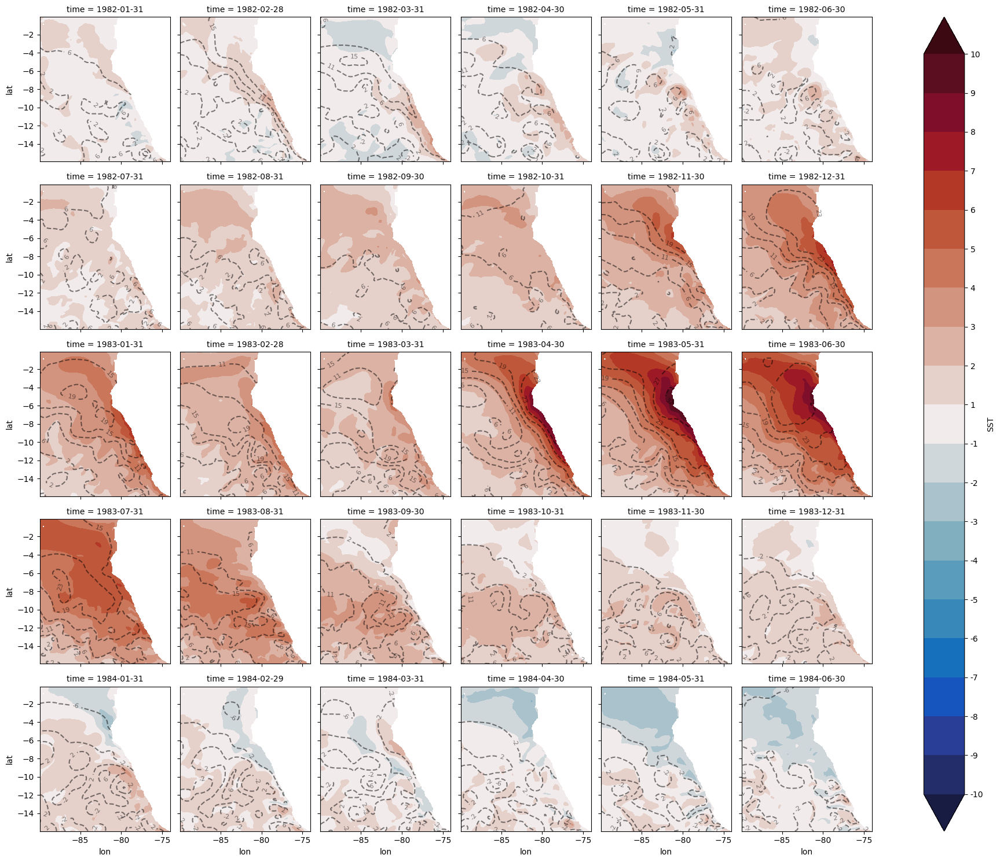

In [14]:
import matplotlib.pyplot as plt
import cmocean.cm as cm
from matplotlib.colors import TwoSlopeNorm
import numpy as np

# Define normalization and levels for SST
norm_sst = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=10)
levels_sst = np.linspace(-10, 10, 20)

# Plot SST as filled contour (background)
g = strat_anomaly.SST.sel(time=slice("1982-01", "1984-06")).plot.contourf(
    x="lon", y="lat", col="time", col_wrap=6,
    cmap=cm.balance, norm=norm_sst, extend='both', levels=levels_sst
)

# Adjust colorbar tick labels for SST
for ax in g.axs.flat:
    if hasattr(ax, "collections") and ax.collections:
        cbar = ax.collections[0].colorbar
        if cbar is not None:
            cbar.set_ticks(levels_sst)
            cbar.set_ticklabels([f'{tick:.0f}' for tick in levels_sst])  # Format tick labels

# Define normalization and levels for SSH
norm_ssh = TwoSlopeNorm(vmin=-40, vcenter=0, vmax=40)
levels_ssh = np.linspace(-40, 40, 20)

# **Corrected Loop to Plot SSH Contours Over SST**
# Extract the correct time values from the FacetGrid
time_values = g.col_names  # Extracts the time values for each subplot

for i, ax in enumerate(g.axs.flat[:len(time_values)]):  # Ensure only valid time indices are used
    time_val = time_values[i]  # Correct time selection

    # Select SSH data at the correct time
    ssh_data = strat_anomaly.SSH.sel(time=time_val)

    # Create contours over the existing contourf plot
    cs = ax.contour(ssh_data.lon, ssh_data.lat, ssh_data,  
                    colors='black', norm=norm_ssh, extend='both', levels=levels_ssh, 
                    linestyles='--', alpha=0.5)  # Dashed contour lines

    ax.clabel(cs, inline=True, fontsize=8, fmt="%.f")  # Add rounded contour labels

# plt.savefig('Figures/ppt_SSTa_SSHabove_ENSO_8283_col5'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()



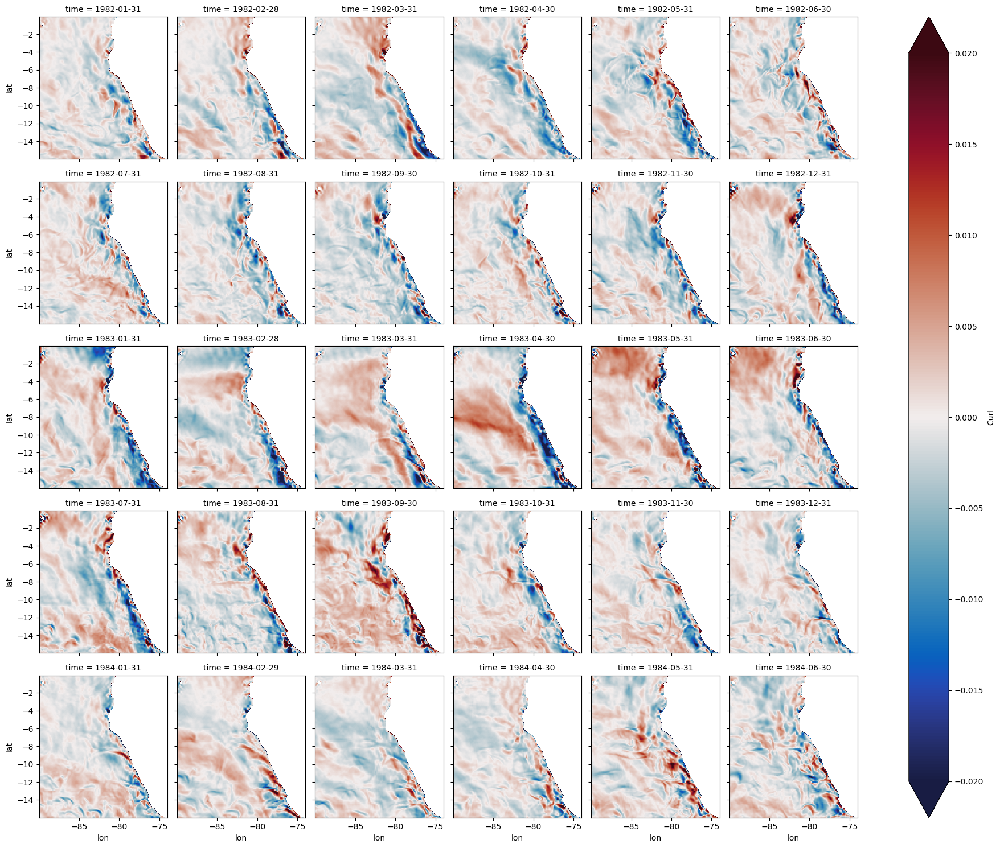

In [15]:
strat_anomaly.Curl.sel(time=slice("1982-01","1984-06")).plot(x="lon", y="lat", col="time", vmin=-0.02,vmax=0.02,col_wrap=6,cmap=cm.balance)
# plt.savefig('Figures/ppt_Curla_ENSO_8283'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

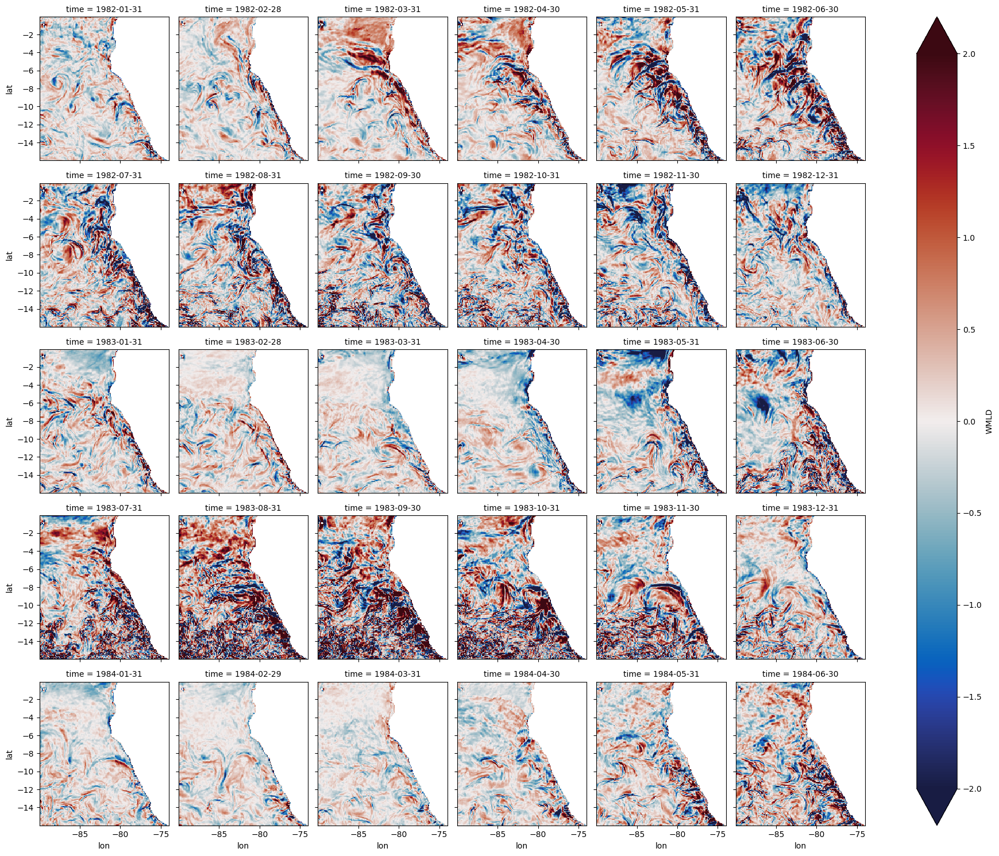

In [16]:
strat_anomaly.WMLD.sel(time=slice("1982-01","1984-06")).plot(x="lon", y="lat", col="time", vmin=-2,vmax=2,col_wrap=6,cmap=cm.balance)
# plt.savefig('Figures/WMLDa_ENSO_8283'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

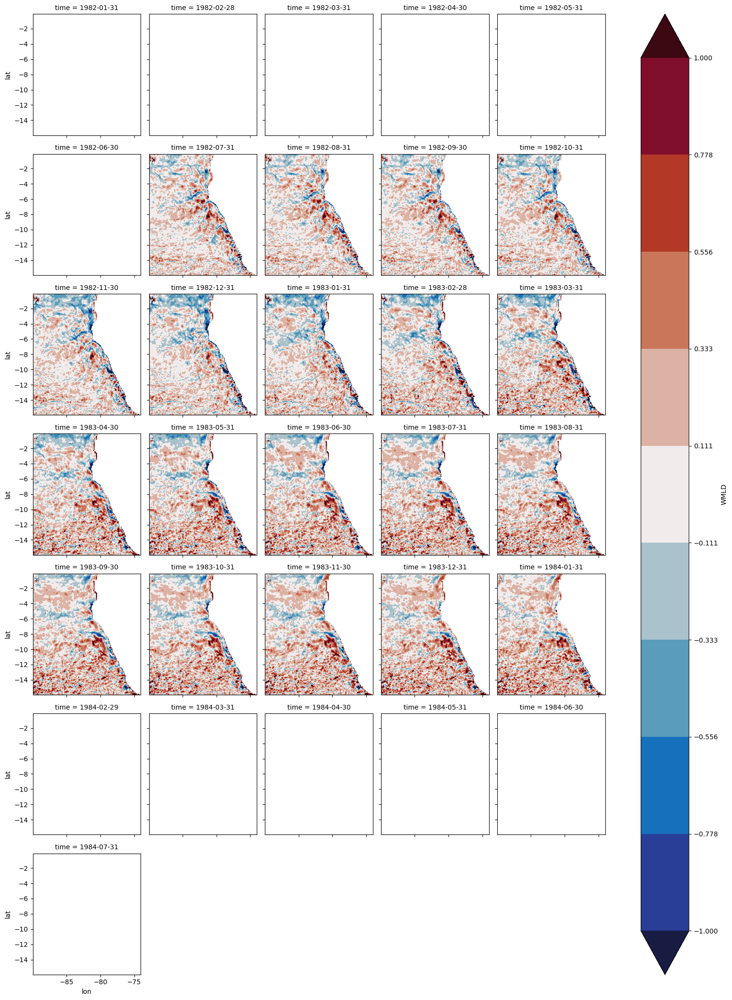

In [17]:
# Define normalization and levels for SST
norm_sst = TwoSlopeNorm(vmin=-1, vcenter=0, vmax=1)
levels_sst = np.linspace(-1, 1, 10)

# Plot SST as filled contour (background)
w = strat_anomaly.WMLD.sel(time=slice("1982-01", "1984-07")).rolling(time=13,center=True).mean().plot.contourf(
    x="lon", y="lat", col="time", col_wrap=5,
    cmap=cm.balance, norm=norm_sst, extend='both', levels=levels_sst
)


#### Videos

In [129]:
import matplotlib.animation as animation

# Your data
data = strat_anomaly.MLD.sel(time=slice("1982-01", "1984-06"))

# Setup figure
fig, ax = plt.subplots(figsize=(5, 4))

# Get time steps
times = data.time.values

# Initialize plot with first frame
im = data.isel(time=0).plot(
    x="lon", y="lat", 
    ax=ax,
    vmin=-30, vmax=30, 
    cmap=cm.balance_r,
    add_colorbar=True,
    cbar_kwargs={'label': 'MLD Anomaly'}
)
title = ax.set_title(f'Time: {str(times[0])[:7]}')

# Animation update function
def update(frame):
    im.set_array(data.isel(time=frame).values.ravel())
    title.set_text(f'Time: {str(times[frame])[:7]}')
    return im, title

# Create animation
anim = animation.FuncAnimation(
    fig, update, 
    frames=len(times),
    interval=200,  # milliseconds between frames (200 = 5 fps)
    blit=True
)

# Save as MP4
# anim.save('MLD_anomaly_1982-1984.mp4', writer='ffmpeg', fps=2, dpi=150)

# Or save as GIF
anim.save('MLD_anomaly_1982-1984.gif', writer='pillow', fps=2)

plt.close()
print("Video saved!")

Video saved!


In [155]:
from pathlib import Path
from tqdm import tqdm

Strat_ts = Strat_ds.sel(lat=slice(-20,0),lon=slice(-110,-74))

Path("frames").mkdir(exist_ok=True)

sst_data = strat_anomaly.SST.sel(time=slice("1980-01", "2015-12"))
ssh_data = strat_anomaly.SSH.sel(time=slice("1980-01", "2015-12"))

for i, t in enumerate(tqdm(sst_data.time.values)):
    fig, ax = plt.subplots(figsize=(5*1.2, 4*1.2))
    
    # SST contourf
    cf = ax.contourf(
        sst_data.lon, sst_data.lat, sst_data.sel(time=t),
        levels=levels_sst, cmap=cm.balance, norm=norm_sst, extend='both'
    )
    
    # SSH contours
    cs = ax.contour(
        ssh_data.lon, ssh_data.lat, ssh_data.sel(time=t),
        levels=levels_ssh, colors='black', linestyles='--', 
        alpha=0.5, linewidths=1
    )
    ax.clabel(cs, inline=True, fontsize=8, fmt="%.0f")

    ax.plot(lonb1,latb1,color='k',linewidth=2)

    # Colorbar
    cbar = plt.colorbar(cf, ax=ax, label='SST Anomaly (°C)')
    cbar.set_ticks(levels_sst[::2])
    cbar.set_ticklabels([f'{tick:.0f}' for tick in levels_sst[::2]])
    
    ax.set_title(f'SST & SSH Anomalies - {str(t)[:7]}')
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    ax.axis([-110, -72, -20, 0])
    plt.savefig(f'frames/frame_{i:03d}.png', dpi=200, bbox_inches='tight')
    plt.close()

print("Frames saved! Now run:")
print("ffmpeg -framerate 3 -i frames/frame_%03d.png -c:v libx264 -pix_fmt yuv420p SST_SSH_anomaly.mp4")

100%|██████████████████████████████████████████████████████████████████████████████████| 432/432 [06:42<00:00,  1.07it/s]

Frames saved! Now run:
ffmpeg -framerate 3 -i frames/frame_%03d.png -c:v libx264 -pix_fmt yuv420p SST_SSH_anomaly.mp4


### NINO 97-98

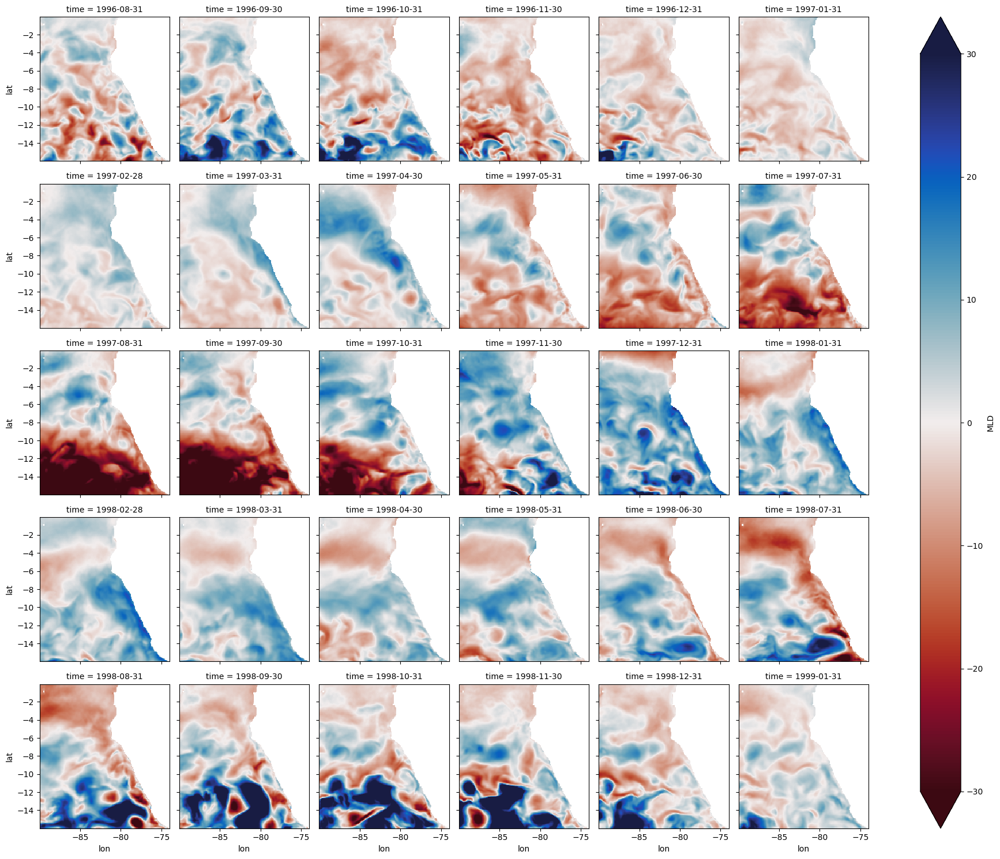

In [18]:
strat_anomaly.MLD.sel(time=slice("1996-08","1999-01")).plot(x="lon", y="lat", col="time", col_wrap=6, vmin=-30,vmax=30,cmap=cm.balance_r)
# plt.savefig('Figures/ppt_MLDa_ENSO_9798'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

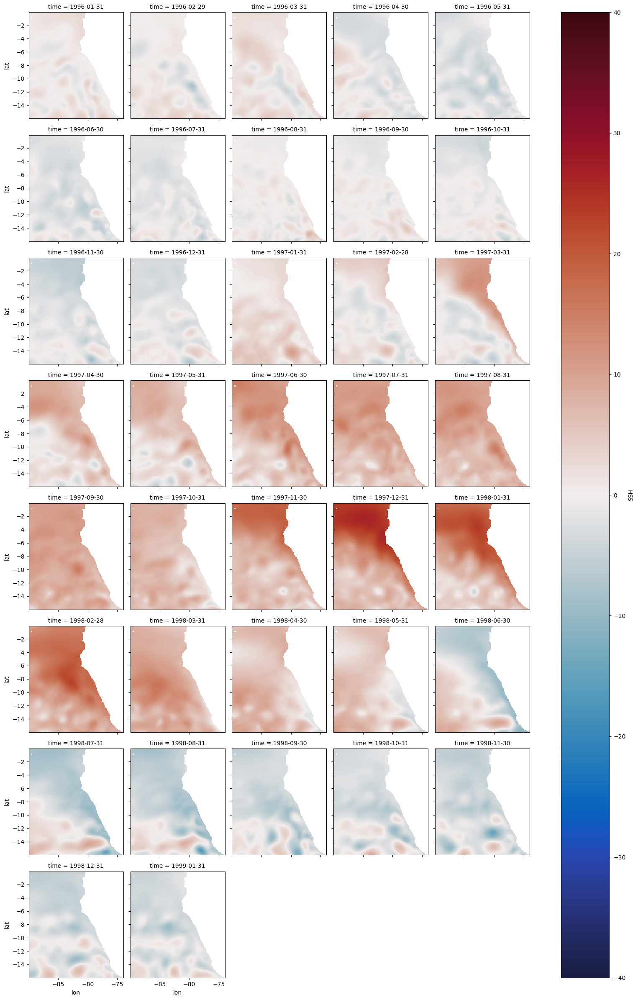

In [19]:
strat_anomaly.SSH.sel(time=slice("1996-01","1999-01")).plot(x="lon", y="lat", col="time", col_wrap=5, vmin=-40,vmax=40,cmap=cm.balance)
# plt.savefig('Figures/MLDa_ENSO_9798'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

/tmp/ipykernel_1156486/285910523.py:8: DeprecationWarning: self.axes is deprecated since 2022.11 in order to align with matplotlibs plt.subplots, use self.axs instead.
  for ax in g.axes.flat:


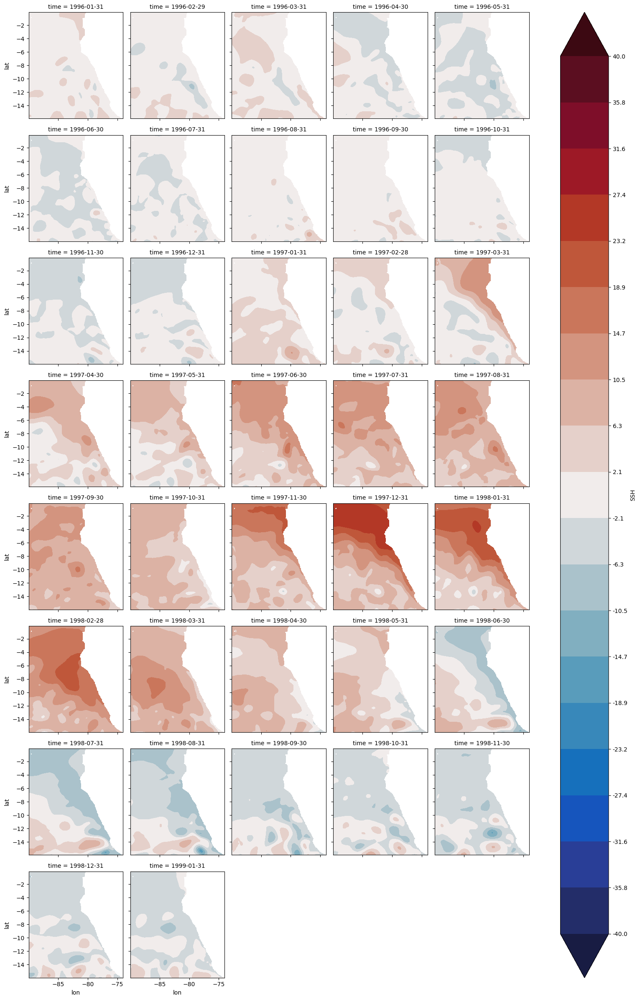

In [20]:
norm = TwoSlopeNorm(vmin=-40, vcenter=0, vmax=40)
levels=np.linspace(-40,40,20)
# strat_anomaly.SSH.sel(time=slice("1982-01","1984-07")).plot(x="lon", y="lat", col="time", col_wrap=5, vmin=-0.5,vmax=0.5,cmap=cm.balance)

g=strat_anomaly.SSH.sel(time=slice("1996-01","1999-01")).plot.contourf(x="lon", y="lat", col="time", col_wrap=5, vmin=-40,vmax=40,
                                                                     cmap=cm.balance,norm=norm, extend='both',levels=levels)
# # Round the colorbar tick labels
for ax in g.axes.flat:
    if hasattr(ax, "collections") and ax.collections:
        cbar = ax.collections[0].colorbar  # Get colorbar from the first contour collection
        if cbar is not None:
            cbar.set_ticks(levels)  # Set tick positions
            cbar.set_ticklabels([f'{tick:.1f}' for tick in levels])  # Format tick labels


# plt.savefig('Figures/SSHa_ENSO_8283'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

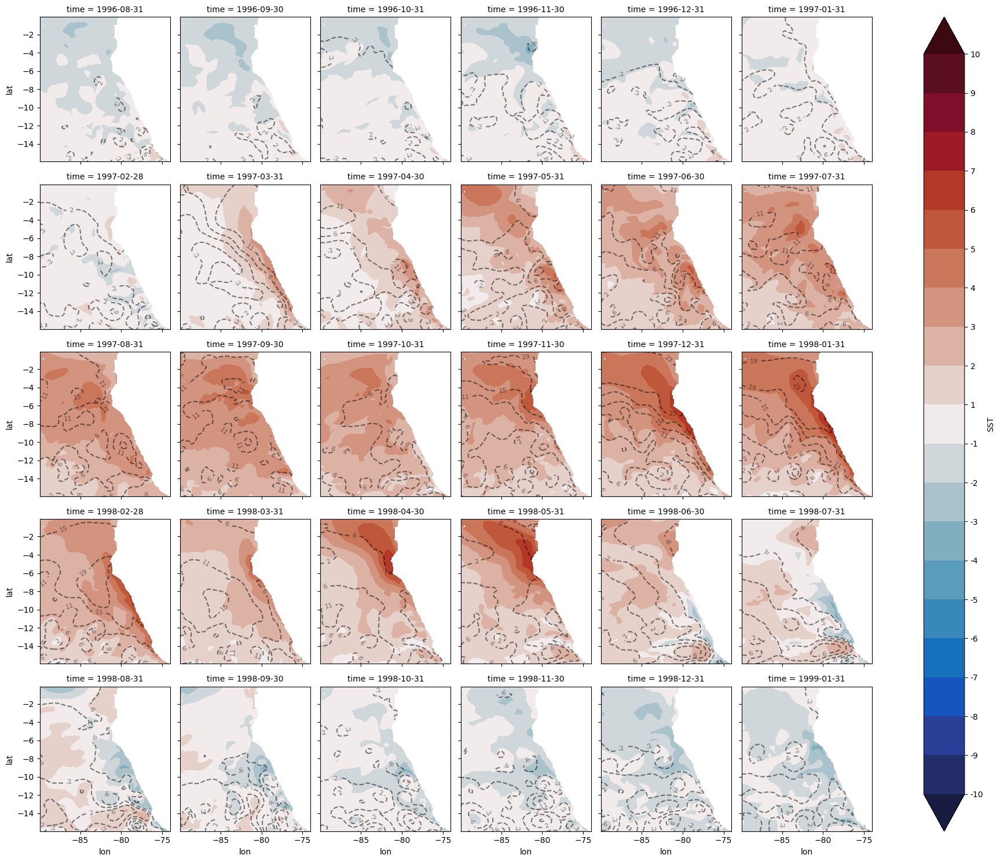

In [21]:
# Define normalization and levels for SST
norm_sst = TwoSlopeNorm(vmin=-10, vcenter=0, vmax=10)
levels_sst = np.linspace(-10, 10, 20)

# Plot SST as filled contour (background)
g = strat_anomaly.SST.sel(time=slice("1996-08","1999-01")).plot.contourf(
    x="lon", y="lat", col="time", col_wrap=6,
    cmap=cm.balance, norm=norm_sst, extend='both', levels=levels_sst
)

# Adjust colorbar tick labels for SST
for ax in g.axs.flat:
    if hasattr(ax, "collections") and ax.collections:
        cbar = ax.collections[0].colorbar
        if cbar is not None:
            cbar.set_ticks(levels_sst)
            cbar.set_ticklabels([f'{tick:.0f}' for tick in levels_sst])  # Format tick labels

# Define normalization and levels for SSH
norm_ssh = TwoSlopeNorm(vmin=-40, vcenter=0, vmax=40)
levels_ssh = np.linspace(-40, 40, 20)

# **Corrected Loop to Plot SSH Contours Over SST**
# Extract the correct time values from the FacetGrid
time_values = g.col_names  # Extracts the time values for each subplot

for i, ax in enumerate(g.axs.flat[:len(time_values)]):  # Ensure only valid time indices are used
    time_val = time_values[i]  # Correct time selection

    # Select SSH data at the correct time
    ssh_data = strat_anomaly.SSH.sel(time=time_val)

    # Create contours over the existing contourf plot
    cs = ax.contour(ssh_data.lon, ssh_data.lat, ssh_data,  
                    colors='black', norm=norm_ssh, extend='both', levels=levels_ssh, 
                    linestyles='--', alpha=0.5)  # Dashed contour lines

    ax.clabel(cs, inline=True, fontsize=8, fmt="%.f")  # Add rounded contour labels

# plt.savefig('Figures/ppt_SSTa_SSHabove_ENSO_9798_col5'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

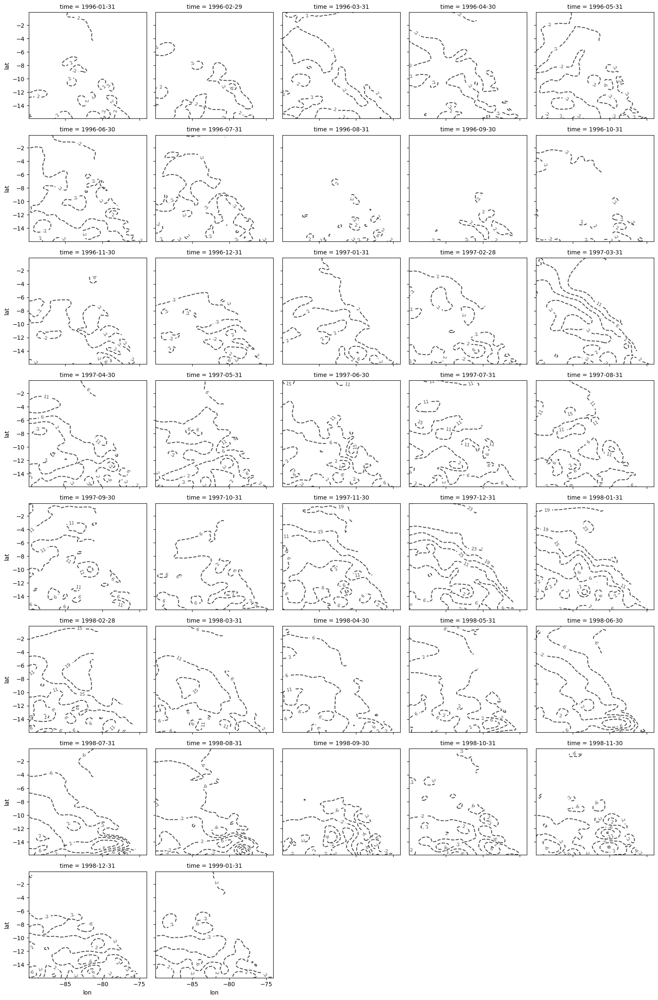

In [22]:
# Create contour plot
g = strat_anomaly.SSH.sel(time=slice("1996-01","1999-01")).plot.contour(
    x="lon", y="lat", col="time", col_wrap=5,
    colors='black', norm=norm, extend='both', levels=levels, linestyles='--', alpha=0.7,
)

# Loop through each subplot and add labels
for i, ax in enumerate(g.axs.flat):  # Use .axs instead of .axes
    # Get the contour sets created in each subplot
    contour_set = ax.collections  # `collections` contains contour lines
    
    if contour_set:
        ax.clabel(contour_set[0], inline=True, fontsize=8,fmt="%.f")  # Add contour labels

plt.show()


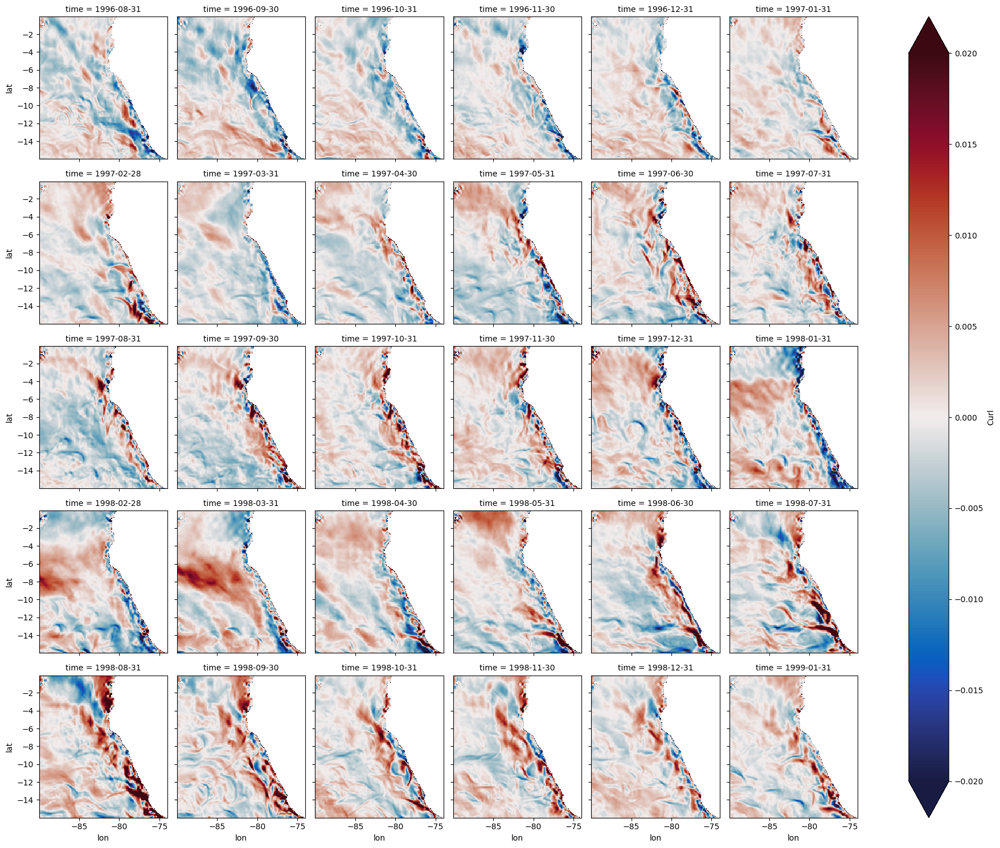

In [23]:
strat_anomaly.Curl.sel(time=slice("1996-08","1999-01")).plot(x="lon", y="lat", col="time", vmin=-0.02,vmax=0.02,col_wrap=6,cmap=cm.balance)
# plt.savefig('Figures/ppt_Curla_ENSO_9798'+'.png', format='png', dpi=300, transparent=False, bbox_inches='tight')
plt.show()

## Hovmollers 

In [25]:
### dataset

Strat_ds 


<xarray.Dataset> Size: 7GB
Dimensions:  (time: 432, lat: 542, lon: 602)
Coordinates:
  * lon      (lon) float64 5kB -119.0 -118.9 -118.8 ... -69.03 -68.95 -68.87
  * lat      (lat) float64 4kB -33.0 -32.93 -32.86 -32.79 ... 9.869 9.951 10.03
  * time     (time) datetime64[ns] 3kB 1980-01-31 1980-02-29 ... 2015-12-31
Data variables:
    MLD      (time, lat, lon) float64 1GB 0.9402 0.9402 1.335 ... nan nan nan
    WMLD     (time, lat, lon) float64 1GB 0.003986 0.003986 0.02448 ... nan nan
    Curl     (time, lat, lon) float64 1GB 0.002233 0.003312 0.005077 ... nan nan
    Ekt      (time, lat, lon) float64 1GB -8.457e+03 -8.815e+03 ... nan nan
    SST      (time, lat, lon) float64 1GB 20.19 20.18 20.24 ... nan nan nan
    SSH      (time, lat, lon) float64 1GB 21.2 21.2 21.17 21.16 ... nan nan nan

In [49]:
equator = Strat_ds.sel(lat=slice(-2,2),lon=slice(None,-78)).mean(dim='lat',skipna=True)
equator 

<xarray.Dataset> Size: 10MB
Dimensions:  (time: 432, lon: 492)
Coordinates:
  * lon      (lon) float64 4kB -119.0 -118.9 -118.8 ... -78.2 -78.12 -78.03
  * time     (time) datetime64[ns] 3kB 1980-01-31 1980-02-29 ... 2015-12-31
Data variables:
    MLD      (time, lon) float64 2MB 48.08 48.08 48.99 50.24 ... nan nan nan nan
    WMLD     (time, lon) float64 2MB 1.692 1.692 3.368 2.964 ... nan nan nan nan
    Curl     (time, lon) float64 2MB 0.003935 0.003243 0.002615 ... nan nan nan
    Ekt      (time, lon) float64 2MB -3.121e+07 -3.051e+07 ... nan nan
    SST      (time, lon) float64 2MB 24.86 24.77 24.74 24.7 ... nan nan nan nan
    SSH      (time, lon) float64 2MB 31.47 31.47 31.4 31.29 ... nan nan nan nan

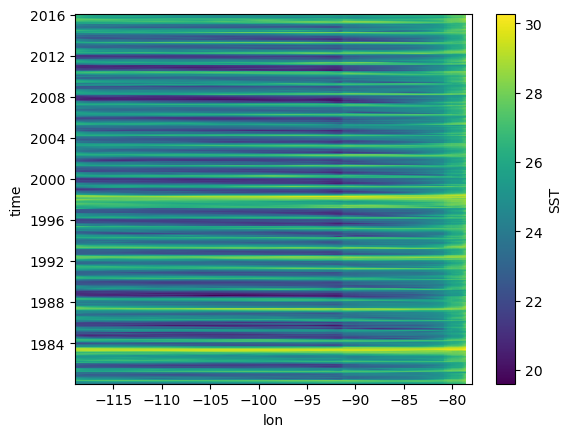

In [50]:
equator.SST.plot(x='')

In [158]:
print(UV_all)


<xarray.Dataset> Size: 2GB
Dimensions:  (time: 432, lon: 602, lat: 542)
Coordinates:
  * time     (time) datetime64[ns] 3kB 1980-01-01 1980-02-01 ... 2015-12-01
  * lat      (lat) float64 4kB -33.0 -32.93 -32.86 -32.79 ... 9.869 9.951 10.03
  * lon      (lon) float64 5kB -119.0 -118.9 -118.8 ... -69.03 -68.95 -68.87
Data variables:
    u        (time, lon, lat) float32 564MB dask.array<chunksize=(1, 602, 542), meta=np.ndarray>
    v        (time, lon, lat) float32 564MB dask.array<chunksize=(1, 602, 542), meta=np.ndarray>
    uv       (lat, lon, time) float32 564MB dask.array<chunksize=(542, 602, 1), meta=np.ndarray>


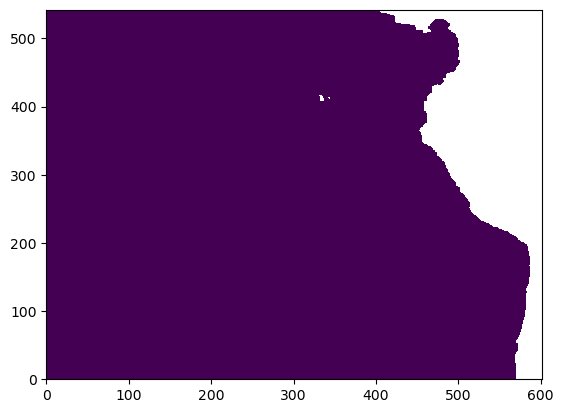

In [194]:
plt.pcolor(expanded_mask[1,:,:])

In [189]:
print(expanded_mask.shape)
print(UV_all.transpose('time','lat','lon'))

(432, 542, 602)
<xarray.Dataset> Size: 2GB
Dimensions:  (time: 432, lon: 602, lat: 542)
Coordinates:
  * time     (time) datetime64[ns] 3kB 1980-01-01 1980-02-01 ... 2015-12-01
  * lat      (lat) float64 4kB -33.0 -32.93 -32.86 -32.79 ... 9.869 9.951 10.03
  * lon      (lon) float64 5kB -119.0 -118.9 -118.8 ... -69.03 -68.95 -68.87
Data variables:
    u        (time, lat, lon) float32 564MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    v        (time, lat, lon) float32 564MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    uv       (time, lat, lon) float32 564MB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>


In [198]:
dsUV = (UV_all.transpose('time','lat','lon') * expanded_mask)
dsUV

<xarray.Dataset> Size: 3GB
Dimensions:  (time: 432, lat: 542, lon: 602)
Coordinates:
  * time     (time) datetime64[ns] 3kB 1980-01-01 1980-02-01 ... 2015-12-01
  * lat      (lat) float64 4kB -33.0 -32.93 -32.86 -32.79 ... 9.869 9.951 10.03
  * lon      (lon) float64 5kB -119.0 -118.9 -118.8 ... -69.03 -68.95 -68.87
Data variables:
    u        (time, lat, lon) float64 1GB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    v        (time, lat, lon) float64 1GB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>
    uv       (time, lat, lon) float64 1GB dask.array<chunksize=(1, 542, 602), meta=np.ndarray>

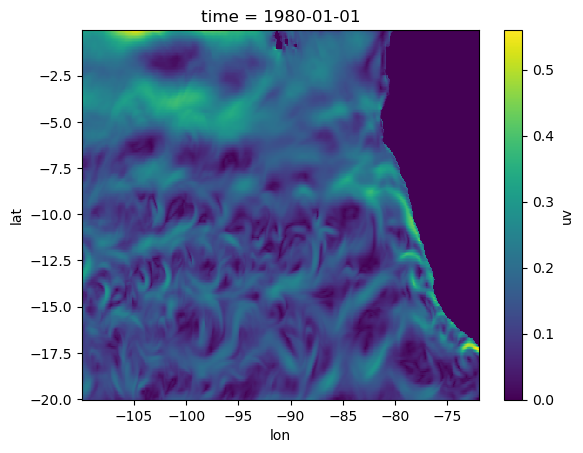

In [221]:
UV_all.uv.isel(time=0).sel(lat=slice(-20,0),lon=slice(-110,-72)).plot()

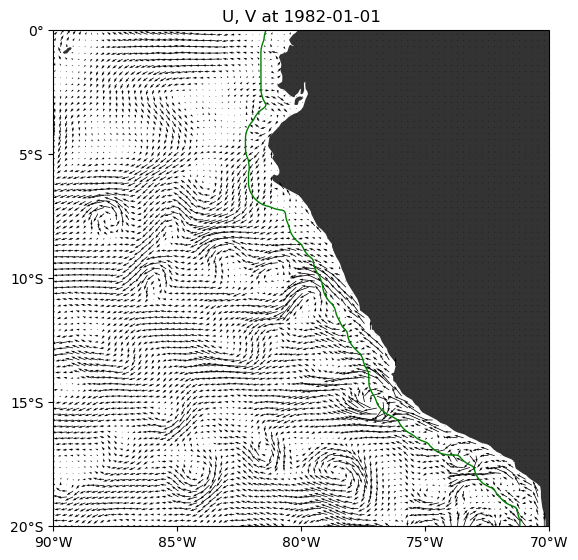

In [258]:
# import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

# choose a time step
t = '1982-01-01'   # or ds.time[0].item(), etc.
ds_t = (UV_all).sel(time=t).sel(lon=slice(-110,-70),lat=slice(-20,0))
                                                               

# optionally subsample to avoid a forest of arrows
step = 3  # every 5th point in lon/lat
lon2d, lat2d = np.meshgrid(ds_t.lon[::step], ds_t.lat[::step], indexing='xy')

u_plot = ds_t.u[::step, ::step].T  # (lat, lon) for quiver
v_plot = ds_t.v[::step, ::step].T

proj = ccrs.PlateCarree()

fig = plt.figure(figsize=(4*1.6, 5*1.6))
ax = plt.axes(projection=proj)

# plt.figure(figsize=(4*1.2, 5*1.2))
ax.quiver(lon2d, lat2d, u_plot, v_plot, scale=10, angles='xy', width=0.0015)

ax.plot(lonb1,latb1,color='g',linewidth=1)
ax.axis([-90, -72, -20, 0])

# plt.title(f'U,V at {np.datetime_as_string(np.array(t, 'datetime64[M]'))}')
# ax.coastlines(resolution='110m', linewidth=1)
ax.add_feature(cfeature.LAND, facecolor='0.2') 
ax.set_title(f'U, V at {t}')

# plt.axis('equal')
ax.set_xticks(np.arange(-90, -70+1, 5), crs=proj)
ax.set_yticks(np.arange(-20, 0+1, 5), crs=proj)
ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
plt.show()

In [260]:
import os
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker

# folder for frames
frames_dir = Path("uv_quiver_frames")
frames_dir.mkdir(exist_ok=True)

proj = ccrs.PlateCarree()

# choose the time range for the video
ds_sel = UV_all.sel(time=slice("1982-01-01", "2015-12-01"))  # adjust as you like

step = 3  # every 3rd point in lon/lat (same as your code)

for i, t in enumerate(ds_sel.time.values):
    # ==== YOUR CODE STARTS HERE ====
    ds_t = (UV_all).sel(time=t).sel(lon=slice(-110, -70), lat=slice(-20, 0))

    lon2d, lat2d = np.meshgrid(ds_t.lon[::step], ds_t.lat[::step], indexing='xy')

    u_plot = ds_t.u[::step, ::step].T
    v_plot = ds_t.v[::step, ::step].T

    fig = plt.figure(figsize=(4*1.6, 5*1.6))
    ax = plt.axes(projection=proj)

    ax.quiver(lon2d, lat2d, u_plot, v_plot,
              scale=10, angles='xy', width=0.0015)

    ax.plot(lonb1, latb1, color='g', linewidth=1)
    ax.axis([-90, -72, -20, 0])

    ax.add_feature(cfeature.LAND, facecolor='0.2')
    # title with year-month as in your example
    t_str = np.datetime_as_string(t, unit="M")
    ax.set_title(f"U, V at {t_str}")

    ax.set_xticks(np.arange(-90, -70+1, 5), crs=proj)
    ax.set_yticks(np.arange(-20, 0+1, 5), crs=proj)
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    # ==== YOUR CODE ENDS HERE ====

    # save frame
    frame_path = frames_dir / f"frame_{i:03d}.png"
    plt.savefig(frame_path, dpi=150, bbox_inches="tight")
    plt.close(fig)
    print(f"Saved {frame_path}")

Saved uv_quiver_frames/frame_000.png
Saved uv_quiver_frames/frame_001.png
Saved uv_quiver_frames/frame_002.png
Saved uv_quiver_frames/frame_003.png
Saved uv_quiver_frames/frame_004.png
Saved uv_quiver_frames/frame_005.png
Saved uv_quiver_frames/frame_006.png
Saved uv_quiver_frames/frame_007.png
Saved uv_quiver_frames/frame_008.png
Saved uv_quiver_frames/frame_009.png
Saved uv_quiver_frames/frame_010.png
Saved uv_quiver_frames/frame_011.png
Saved uv_quiver_frames/frame_012.png
Saved uv_quiver_frames/frame_013.png
Saved uv_quiver_frames/frame_014.png
Saved uv_quiver_frames/frame_015.png
Saved uv_quiver_frames/frame_016.png
Saved uv_quiver_frames/frame_017.png
Saved uv_quiver_frames/frame_018.png
Saved uv_quiver_frames/frame_019.png
Saved uv_quiver_frames/frame_020.png
Saved uv_quiver_frames/frame_021.png
Saved uv_quiver_frames/frame_022.png
Saved uv_quiver_frames/frame_023.png
Saved uv_quiver_frames/frame_024.png
Saved uv_quiver_frames/frame_025.png
Saved uv_quiver_frames/frame_026.png
S

In [311]:
import matplotlib.pyplot as plt
import numpy as np
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.mpl.ticker as cticker
from matplotlib.colors import TwoSlopeNorm
import cmocean.cm as cm

proj = ccrs.PlateCarree()
# folder for frames
frames_dir = Path("SST_UV_frames")
frames_dir.mkdir(exist_ok=True)

# choose a time step
for i, t in enumerate(time):
    tt = str(time[i])[:7]
    sst_t = strat_anomaly.SST.sel(time=tt).sel(lon=slice(-110, -70), lat=slice(-20, 0)).isel(time=0)
    ds_t  = UV_all.sel(time=tt).sel(lon=slice(-110, -70), lat=slice(-20, 0)).isel(time=0)
    
    # --- SST settings (adjust to your needs) ---
    norm_sst = TwoSlopeNorm(vmin=-5, vcenter=0, vmax=5)
    levels_sst = np.linspace(-5, 5, 20)
    
    # --- subsample for quiver ---
    step = 3
    lon_sub = ds_t.lon[::step]
    lat_sub = ds_t.lat[::step]
    lon2d, lat2d = np.meshgrid(lon_sub, lat_sub, indexing='xy')
    
    # UV_all is (time, lat, lon), so (lat_sub, lon_sub) gives (nlat, nlon)
    u_plot = ds_t.u[::step, ::step].T
    v_plot = ds_t.v[::step, ::step].T
    
    fig = plt.figure(figsize=(4*1.6, 5*1.6))
    ax = plt.axes(projection=proj)
    
    # map extent
    ax.set_extent([-90, -70, -20, 0], crs=proj)
    
    # land / coast
    ax.add_feature(cfeature.LAND, facecolor='0.2', zorder=0)
    # ax.coastlines(resolution='110m', linewidth=1)
    
    # 1) SST background
    cf = ax.contourf(
        sst_t.lon, sst_t.lat, sst_t,
        levels=levels_sst, cmap=cm.balance, norm=norm_sst, extend='both',
        transform=proj, zorder=1
    )
    cbar = plt.colorbar(cf, ax=ax, label='SST anomaly (°C)')
    cbar.set_ticks(levels_sst[::2])
    cbar.set_ticklabels([f'{v:.0f}' for v in levels_sst[::2]])
    
    # 2) Quiver on top
    Q = ax.quiver(
        lon2d, lat2d, u_plot, v_plot,
        transform=proj,
        scale=10, width=0.0015, color='k'
    )
    
    # optional coastline you already had
    ax.plot(lonb1, latb1, color='g', linewidth=1, transform=proj, zorder=3)
    
    # ticks & labels
    ax.set_xticks(np.arange(-90, -70 + 1, 5), crs=proj)
    ax.set_yticks(np.arange(-20, 0 + 1, 5), crs=proj)
    ax.xaxis.set_major_formatter(cticker.LongitudeFormatter())
    ax.yaxis.set_major_formatter(cticker.LatitudeFormatter())
    ax.set_xlabel('Longitude')
    ax.set_ylabel('Latitude')
    
    # title
    t_str = np.datetime_as_string(np.array(t, 'datetime64[M]'))
    ax.set_title(f"SST anomaly & U,V at {t_str}")
    
    # plt.show()

    # save frame
    frame_path = frames_dir / f"frame_{i:03d}.png"
    plt.savefig(frame_path, dpi=150, bbox_inches="tight")
    plt.close(fig)
    print(f"Saved {frame_path}")

/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_000.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_001.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_002.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_003.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_004.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_005.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_006.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_007.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_008.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_009.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_010.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_011.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_012.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_013.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_014.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_015.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_016.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_017.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_018.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_019.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_020.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_021.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_022.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_023.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_024.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_025.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_026.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_027.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_028.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_029.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_030.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_031.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_032.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_033.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_034.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_035.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_036.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_037.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_038.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_039.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_040.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_041.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_042.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_043.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_044.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_045.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_046.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_047.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_048.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_049.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_050.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_051.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_052.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_053.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_054.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_055.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_056.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_057.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_058.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_059.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_060.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_061.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_062.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_063.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_064.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_065.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_066.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_067.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_068.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_069.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_070.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_071.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_072.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_073.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_074.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_075.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_076.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_077.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_078.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_079.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_080.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_081.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_082.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_083.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_084.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_085.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_086.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_087.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_088.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_089.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_090.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_091.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_092.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_093.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_094.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_095.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_096.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_097.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_098.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_099.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_100.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_101.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_102.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_103.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_104.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_105.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_106.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_107.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_108.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_109.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_110.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_111.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_112.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_113.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_114.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_115.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_116.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_117.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_118.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_119.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_120.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_121.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_122.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_123.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_124.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_125.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_126.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_127.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_128.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_129.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_130.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_131.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_132.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_133.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_134.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_135.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_136.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_137.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_138.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_139.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_140.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_141.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_142.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_143.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_144.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_145.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_146.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_147.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_148.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_149.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_150.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_151.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_152.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_153.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_154.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_155.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_156.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_157.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_158.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_159.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_160.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_161.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_162.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_163.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_164.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_165.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_166.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_167.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_168.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_169.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_170.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_171.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_172.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_173.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_174.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_175.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_176.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_177.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_178.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_179.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_180.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_181.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_182.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_183.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_184.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_185.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_186.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_187.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_188.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_189.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_190.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_191.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_192.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_193.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_194.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_195.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_196.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_197.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_198.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_199.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_200.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_201.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_202.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_203.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_204.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_205.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_206.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_207.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_208.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_209.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_210.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_211.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_212.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_213.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_214.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_215.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_216.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_217.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_218.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_219.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_220.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_221.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_222.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_223.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_224.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_225.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_226.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_227.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_228.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_229.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_230.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_231.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_232.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_233.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_234.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_235.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_236.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_237.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_238.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_239.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_240.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_241.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_242.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_243.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_244.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_245.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_246.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_247.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_248.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_249.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_250.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_251.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_252.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_253.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_254.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_255.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_256.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_257.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_258.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_259.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_260.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_261.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_262.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_263.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_264.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_265.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_266.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_267.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_268.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_269.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_270.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_271.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_272.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_273.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_274.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_275.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_276.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_277.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_278.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_279.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_280.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_281.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_282.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_283.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_284.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_285.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_286.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_287.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_288.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_289.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_290.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_291.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_292.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_293.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_294.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_295.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_296.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_297.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_298.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_299.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_300.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_301.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_302.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_303.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_304.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_305.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_306.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_307.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_308.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_309.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_310.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_311.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_312.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_313.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_314.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_315.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_316.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_317.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_318.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_319.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_320.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_321.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_322.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_323.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_324.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_325.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_326.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_327.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_328.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_329.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_330.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_331.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_332.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_333.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_334.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_335.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_336.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_337.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_338.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_339.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_340.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_341.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_342.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_343.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_344.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_345.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_346.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_347.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_348.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_349.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_350.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_351.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_352.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_353.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_354.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_355.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_356.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_357.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_358.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_359.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_360.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_361.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_362.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_363.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_364.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_365.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_366.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_367.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_368.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_369.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_370.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_371.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_372.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_373.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_374.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_375.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_376.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_377.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_378.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_379.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_380.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_381.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_382.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_383.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_384.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_385.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_386.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_387.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_388.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_389.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_390.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_391.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_392.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_393.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_394.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_395.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_396.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_397.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_398.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_399.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_400.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_401.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_402.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_403.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_404.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_405.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_406.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_407.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_408.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_409.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_410.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_411.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_412.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_413.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_414.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_415.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_416.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_417.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_418.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_419.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_420.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_421.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_422.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_423.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_424.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_425.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_426.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_427.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_428.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_429.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_430.png


/opt/conda/lib/python3.11/site-packages/shapely/creation.py:119: RuntimeWarning: invalid value encountered in linestrings
  return lib.linestrings(coords, out=out, **kwargs)


Saved SST_UV_frames/frame_431.png


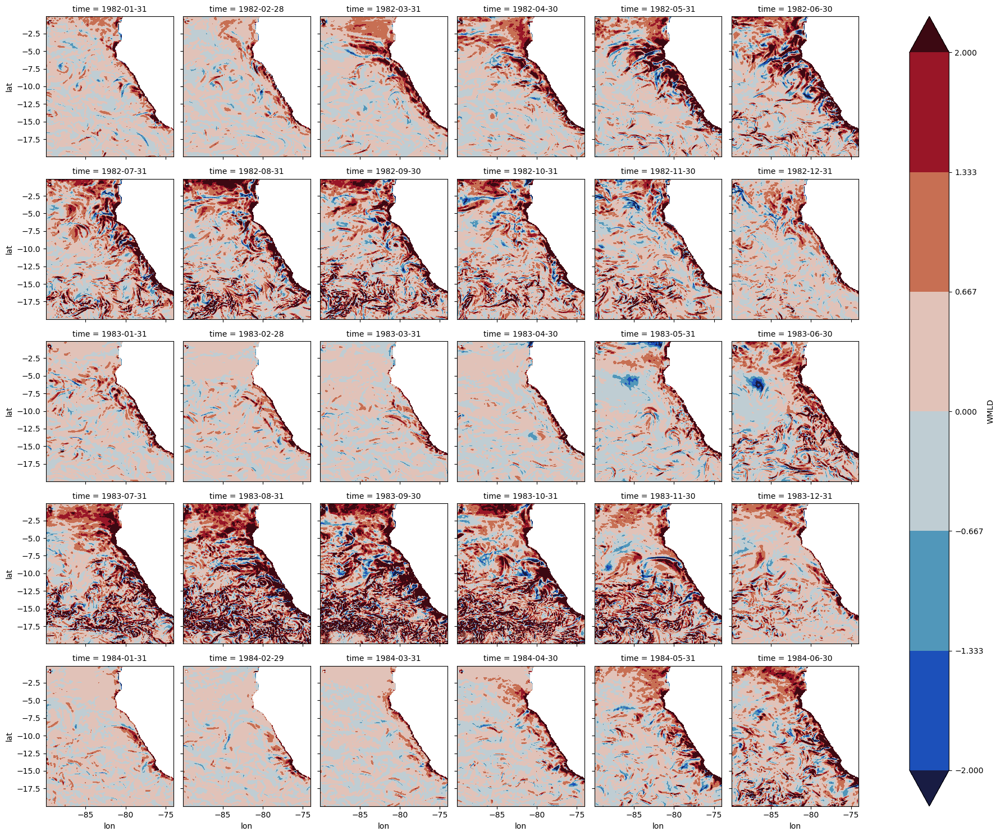

In [319]:
# Strat_ts.WMLD.isel(time=0).plot(robust=True) 
Strat_ts.WMLD.sel(time=slice("1982-01","1984-06")).sel(lat=slice(-20,0),lon=slice(-90,-70)).plot.contourf(x="lon", y="lat", col="time", vmin=-2,vmax=2,col_wrap=6,cmap=cm.balance)
